# Exploring some thresholding techniques

In [43]:
# read the image in 
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 22})

In [54]:
import numpy as np

In [2]:
jellybean = plt.imread("D:\\Jellybean\\Berry Blue.png")

In [17]:
def show_image(image, title='Image', cmap_type='gray'):
    plt.figure(figsize=(50,50)) 
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')
    plt.show()

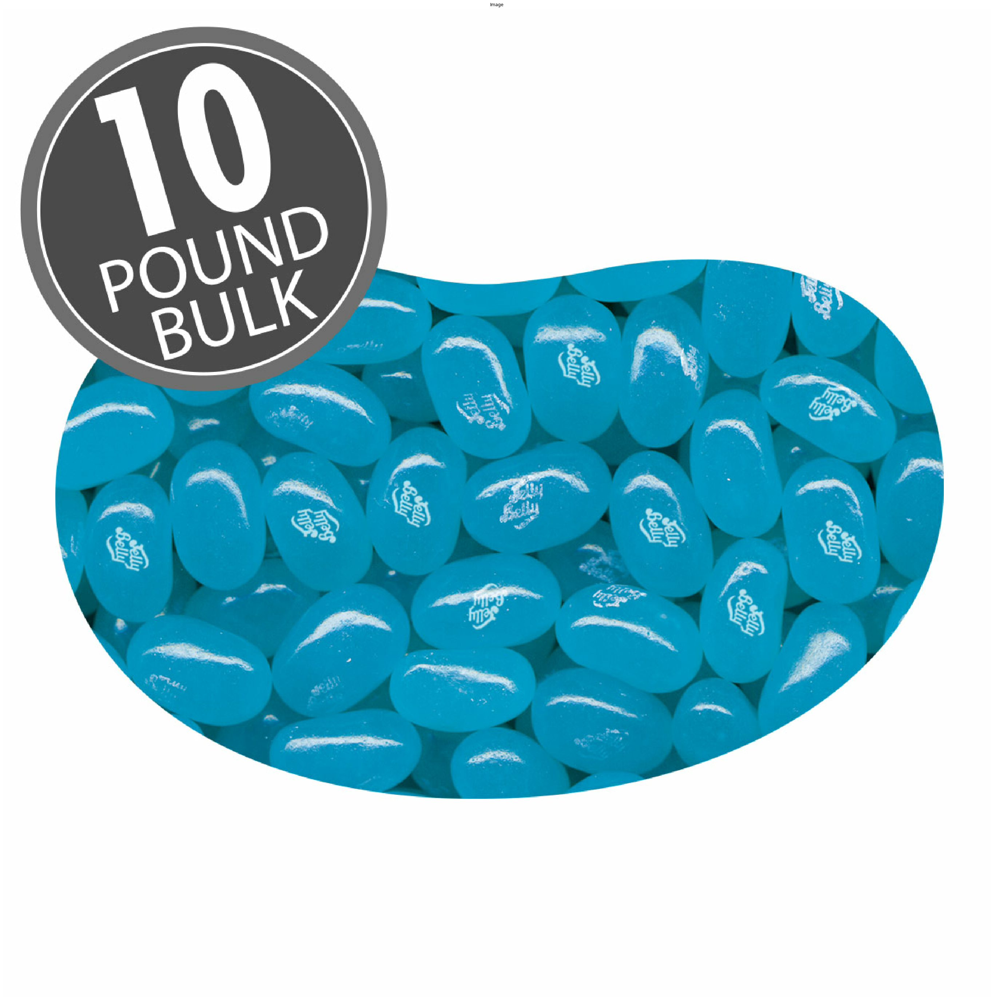

In [18]:
show_image(jellybean)

In [19]:
from skimage import color
grayscale = color.rgb2gray(jellybean)
rgb = color.gray2rgb(grayscale)

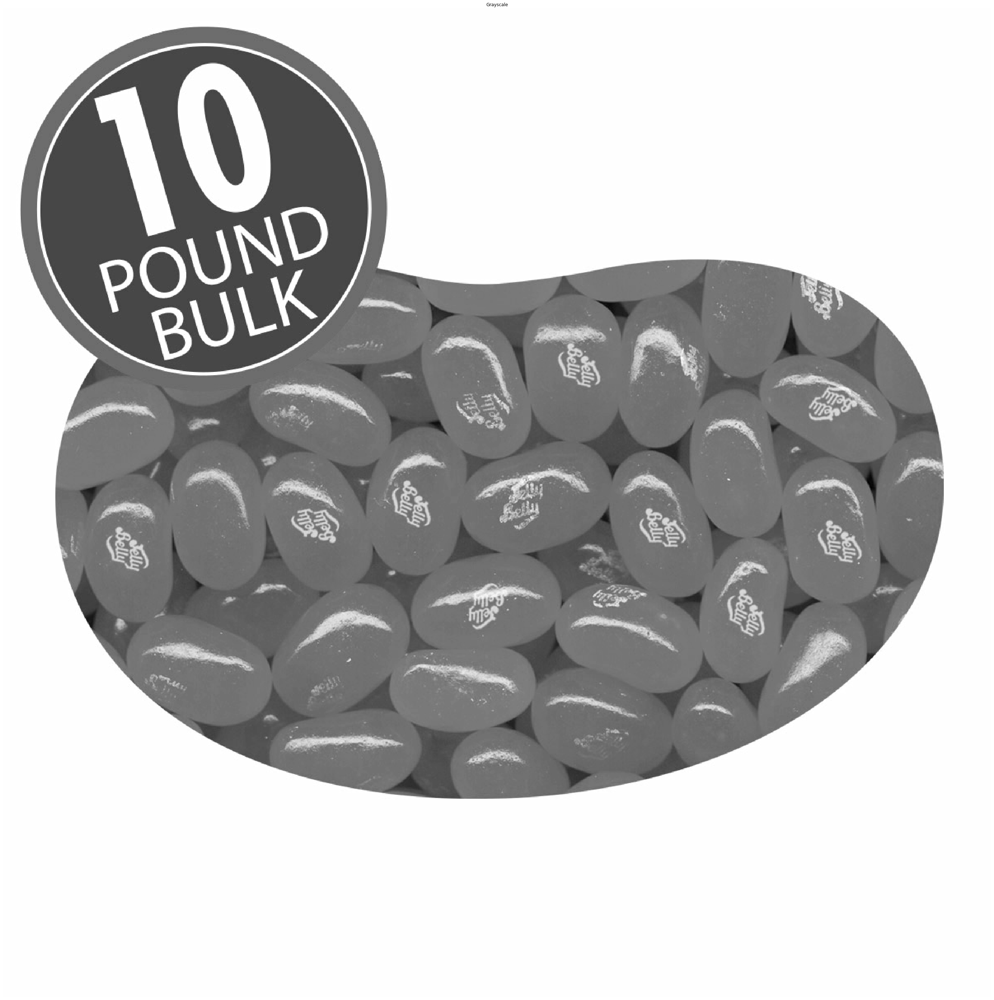

In [20]:
show_image(grayscale,"Grayscale")

In [21]:
rgb.shape

(1200, 1200, 3)

In [22]:
rgb.size

4320000

In [23]:
# Import the try all function
from skimage.filters import try_all_threshold

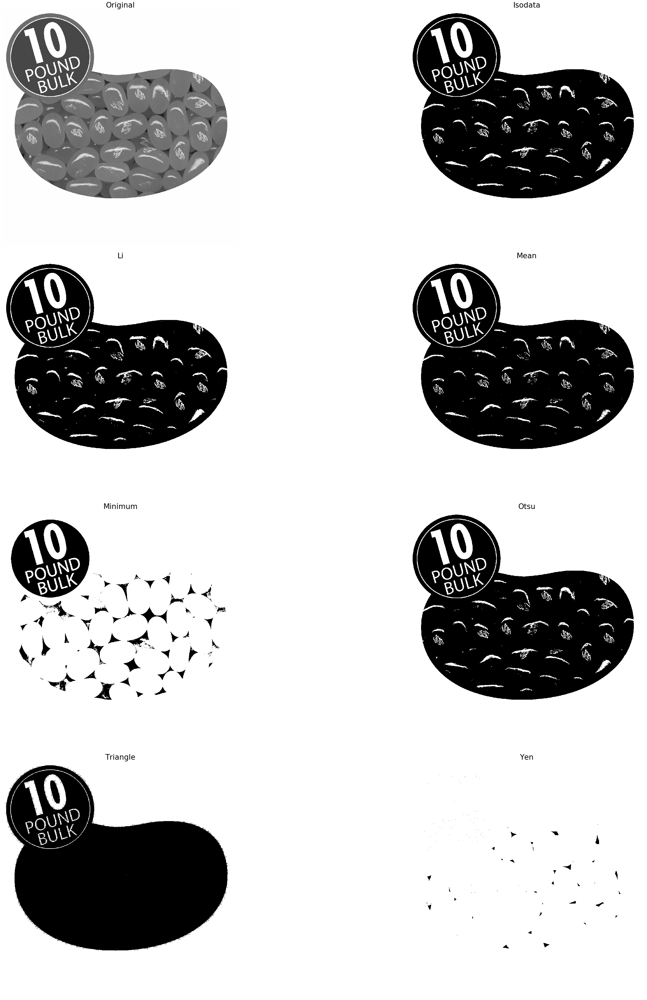

In [34]:
# Use the try all method on the grayscale image
fig, ax = try_all_threshold(grayscale, verbose=False,figsize=(50, 50))

# Show the resulting plots
plt.show()

In [35]:
from skimage.filters import threshold_minimum

In [37]:
thresh_min = threshold_minimum(grayscale)
binary_min = grayscale > thresh_min

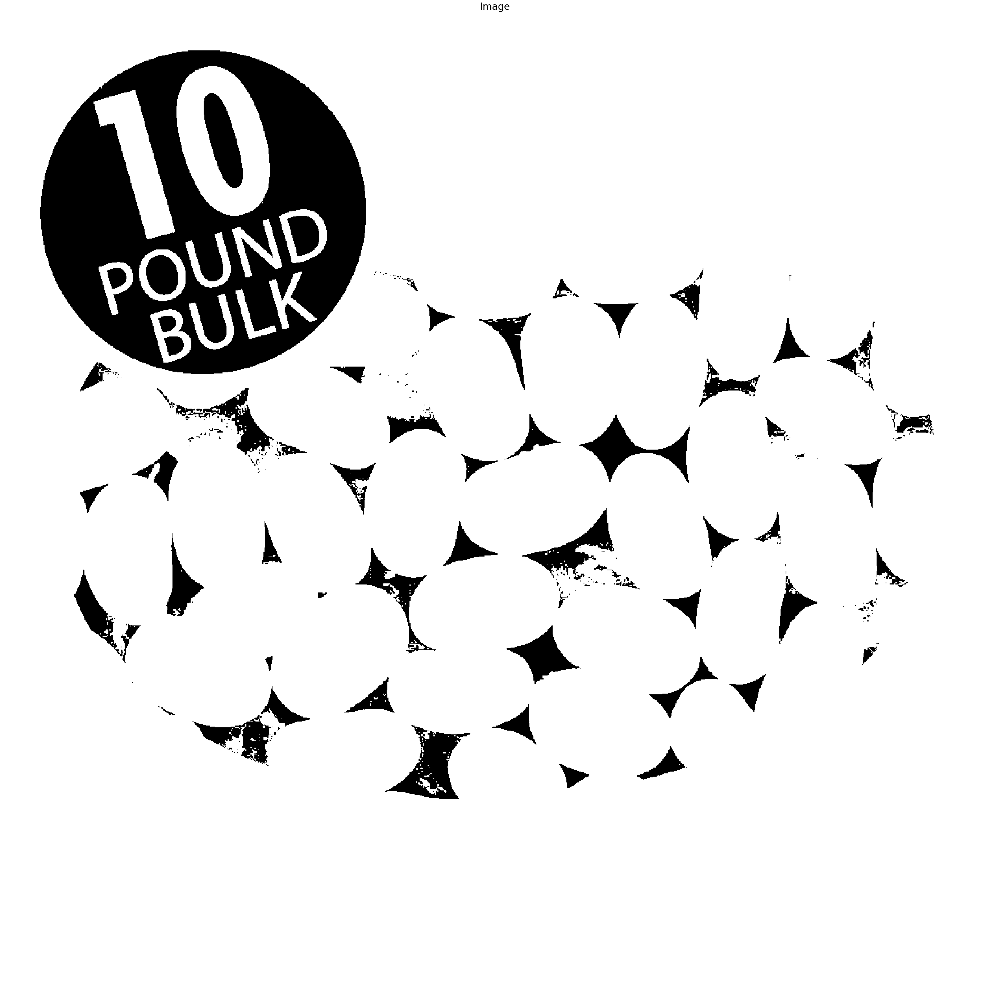

In [38]:
show_image(binary_min)

# Filtering, Edge detection, Smoothing

In [47]:
def plot_comparison(original, filtered, title_filtered):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(50, 50), sharex=True,
    sharey=True)
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title('original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(title_filtered)
    ax2.axis('off')

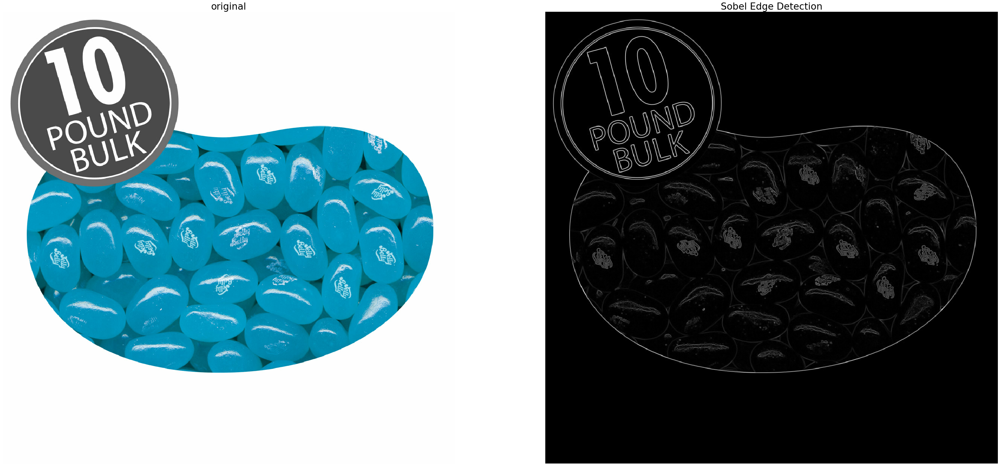

In [48]:
# Import the color module
from skimage import color

# Import the filters module and sobel function
from skimage.filters import sobel

# Apply edge detection filter
edge_sobel = sobel(grayscale)

plot_comparison(jellybean,edge_sobel,"Sobel Edge Detection")

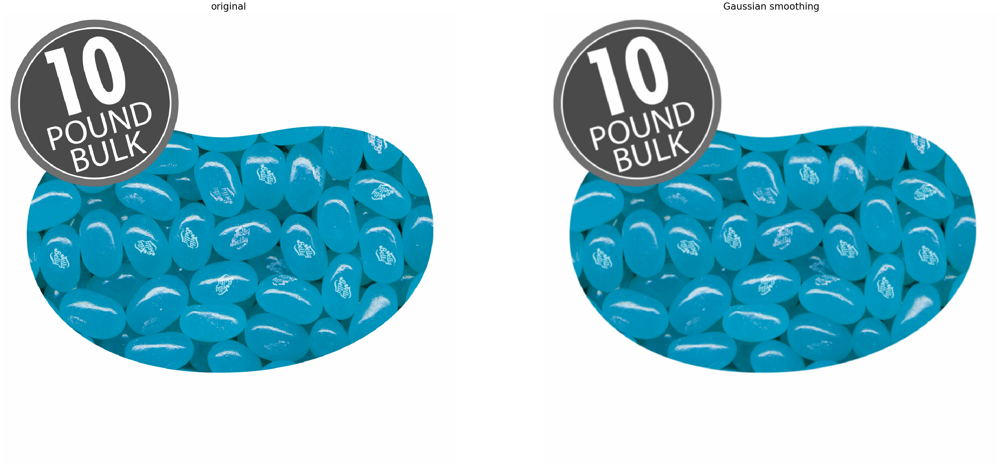

In [50]:
# Import Gaussian filter 
from skimage.filters import gaussian

# Apply filter
gaussian_image = gaussian(jellybean, multichannel=True)

plot_comparison(jellybean,gaussian_image,"Gaussian smoothing")

# Contrast Enhancement

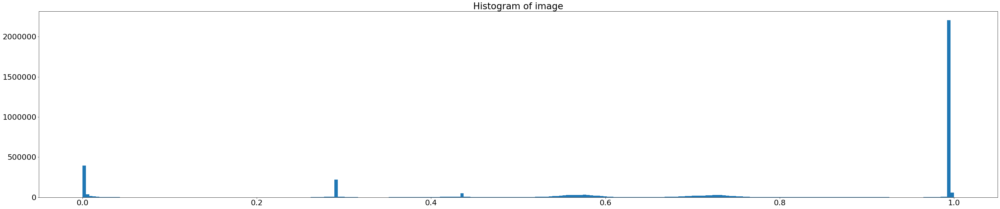

In [51]:
# Import the required module
from skimage import exposure

plt.title('Histogram of image')
plt.hist(jellybean.ravel(), bins=256)
plt.show()

In [56]:
np.max(jellybean.ravel())

1.0

In [60]:
# Use histogram equalization to improve the contrast
jellybean_eq =  exposure.equalize_hist(grayscale)

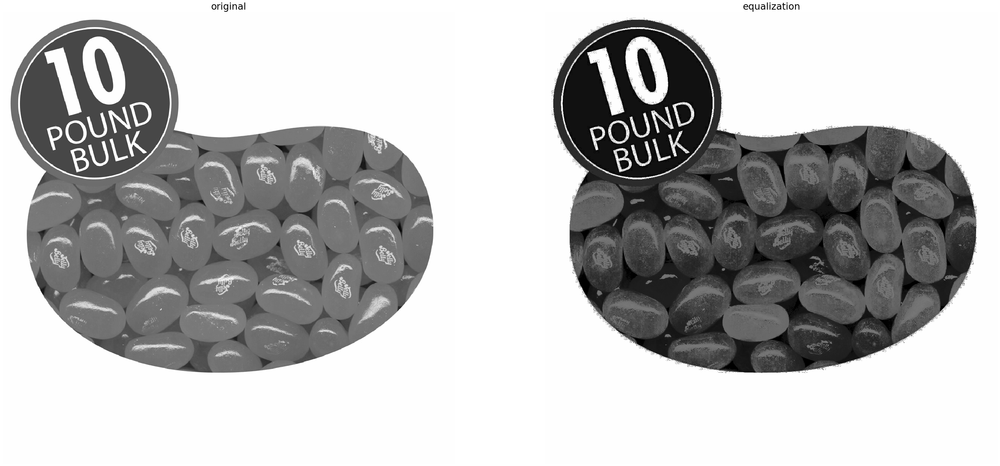

In [65]:
plot_comparison(grayscale,jellybean_eq,"equalization")

# Would rotating/resizing the images help?

In [66]:
# Import the module and the rotate and rescale functions
from skimage.transform import rotate, rescale

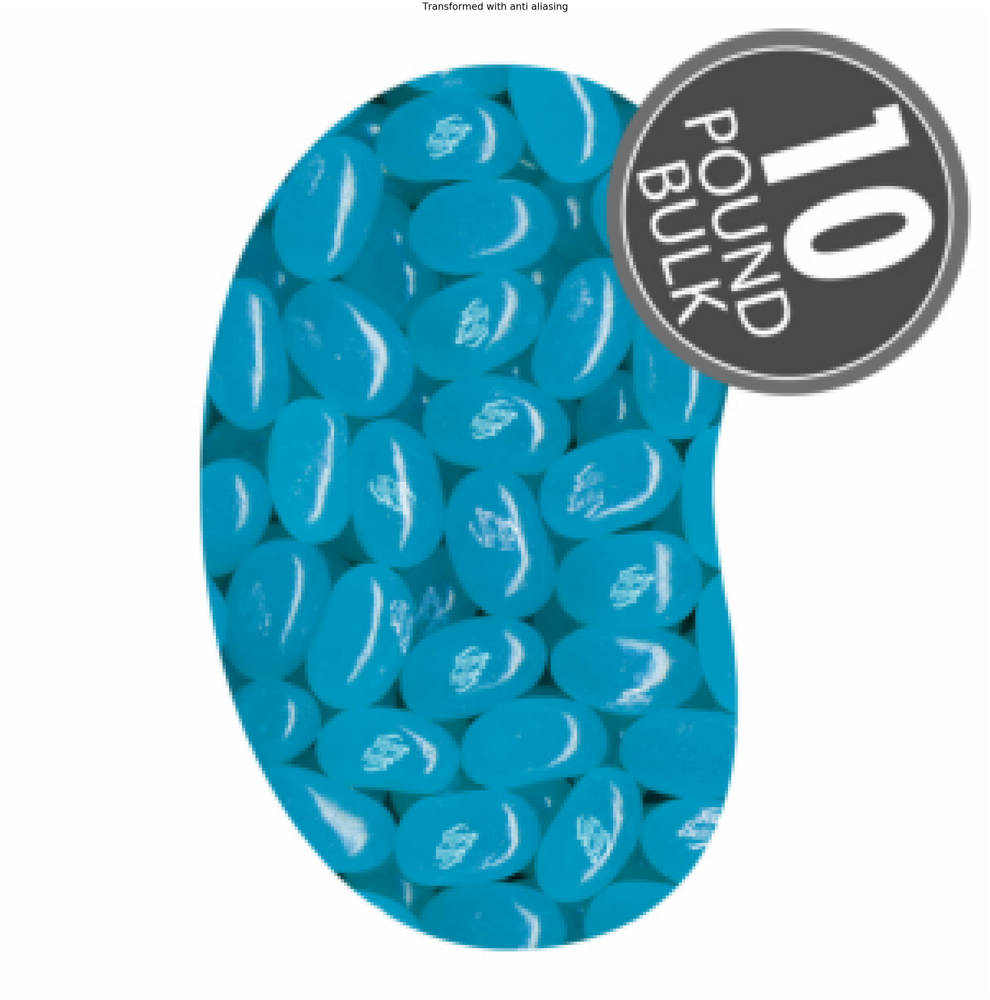

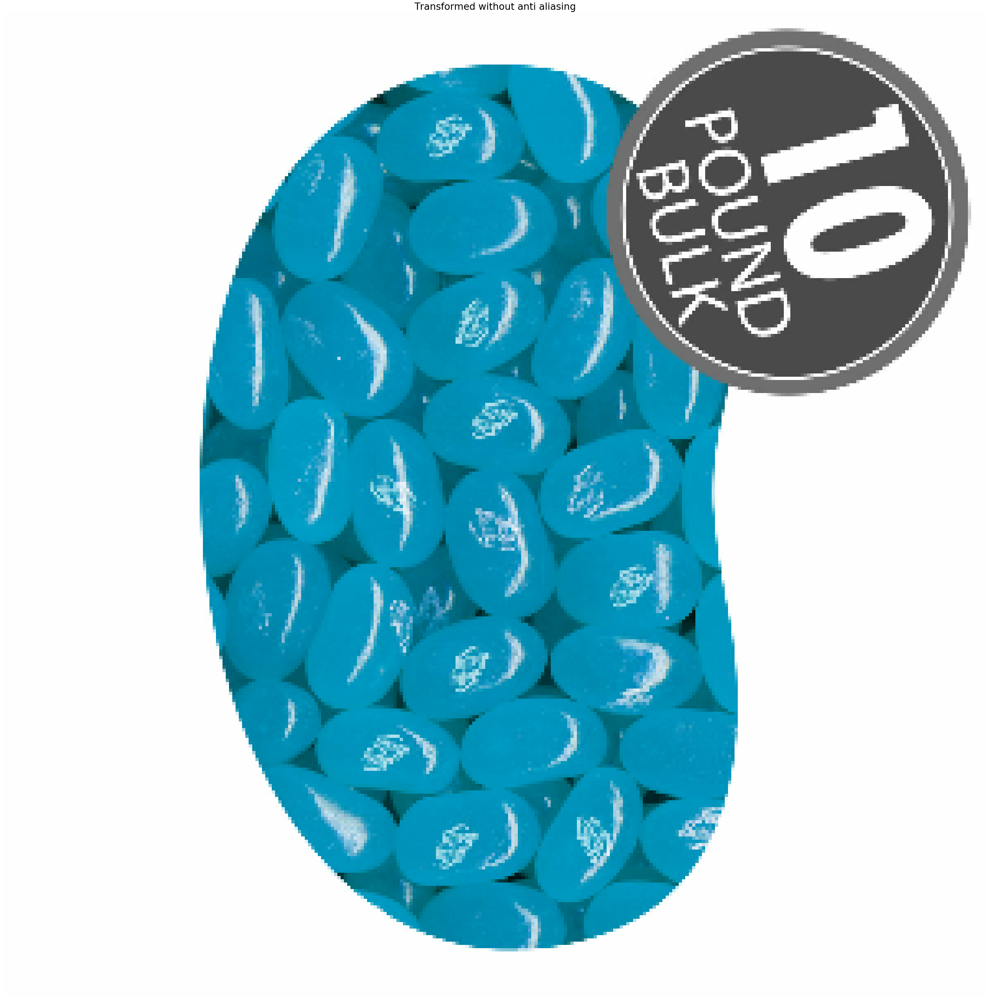

In [67]:
# Rotate the image 90 degrees clockwise 
rotated_image = rotate(jellybean, -90)

# Rescale with anti aliasing
rescaled_with_aa = rescale(rotated_image, 1/4, anti_aliasing=True, multichannel=True)

# Rescale without anti aliasing
rescaled_without_aa = rescale(rotated_image, 1/4, anti_aliasing=False, multichannel=True)

# Show the resulting images
show_image(rescaled_with_aa, "Transformed with anti aliasing")
show_image(rescaled_without_aa, "Transformed without anti aliasing")

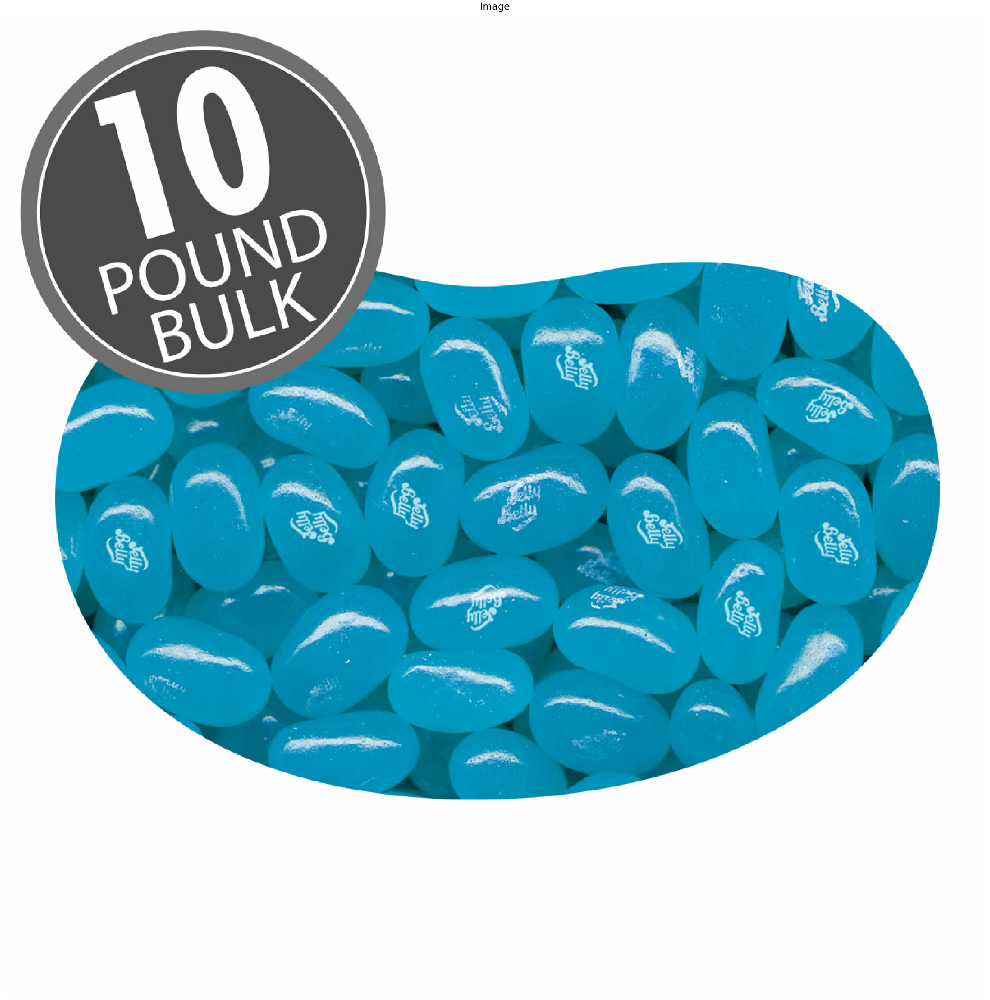

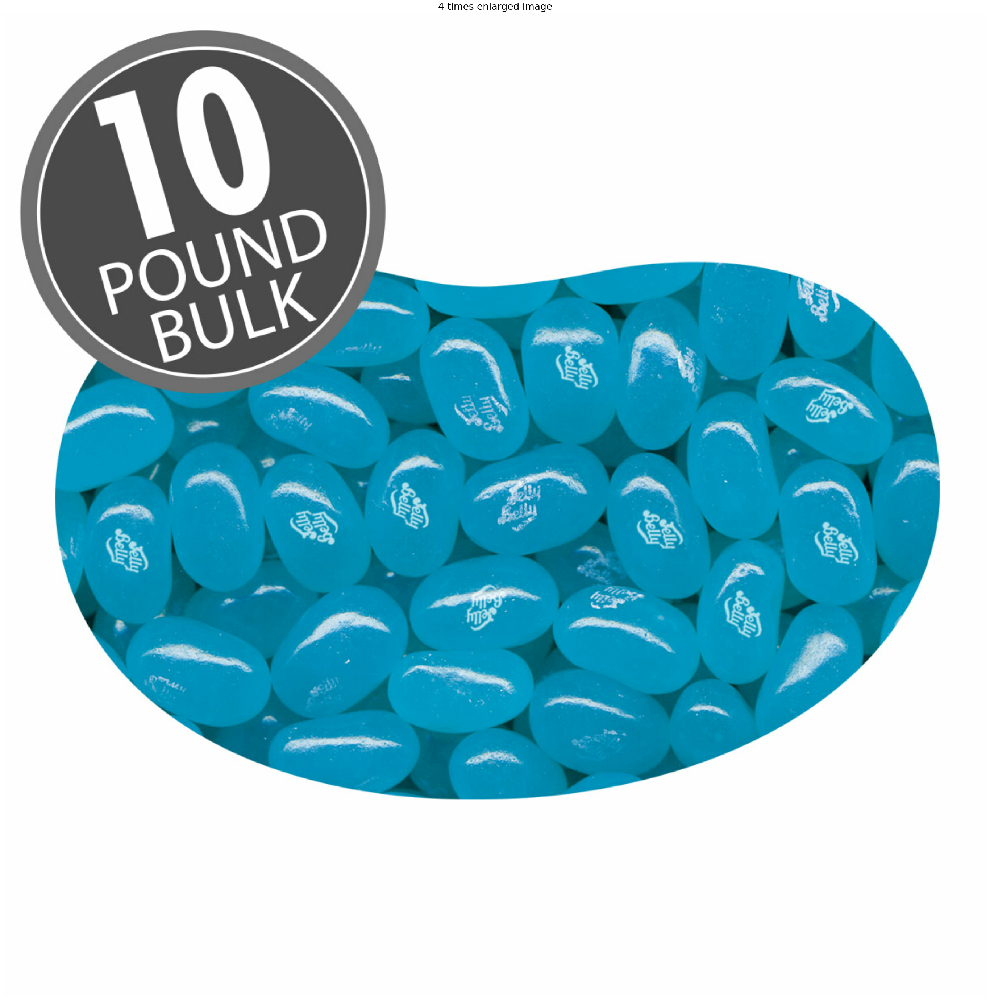

In [68]:
# Enlarge the image so it is 4 times bigger
enlarged_image = rescale(jellybean, 4, anti_aliasing=True, multichannel=True)

# Show original and resulting image
show_image(jellybean)

show_image(enlarged_image, "4 times enlarged image")